In [1]:
import h5py
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt

In [2]:
def get_month_name(month):
    if month == '01':
        name = 'jan'
    elif month == '02':
        name = 'feb'
    elif month == '03':
        name = 'mar'
    elif month == '04':
        name = 'apr'
    elif month == '05':
        name = 'may'
    elif month == '06':
        name = 'jun'
    elif month == '07':
        name = 'jul'
    elif month == '08':
        name = 'aug'
    elif month == '09':
        name = 'sep'
    elif month == '10':
        name = 'oct'
    elif month == '11':
        name = 'nov'
    elif month == '12':
        name = 'dec'
    else:
        raise Exception("Enter a valid month number fom 01-12")
        
    return name

In [3]:
def filter_region(year,month):
    id_gpm = '3B-MO.MS.MRG.3IMERG.{0}{1}01-S000000-E235959.{2}.V06B.HDF5'.format(year,month,month)
    dir_gpm = 'GPM data/{}/'.format(year)
    file_path = dir_gpm+id_gpm
    print('Now processing: ',file_path)
    
    dataset = h5py.File(file_path, 'r')
    grid = dataset['Grid']
    #grid.keys()
    
    longitude_values = np.repeat(list(grid['lon']), 1800)
    latitude_values = list(grid['lat'])*3600
    precipitation_values = np.array(list(grid['precipitation'])).flatten()
    
    dataset = pd.DataFrame({"lon": longitude_values, "lat": latitude_values, "precipitation": precipitation_values})
    dataset.columns = ["lon", "lat", "prec"]
    #dataset.head()
    #Longitude = degrees east
    #latitude = degrees north
    
    # Mask missing precipitation values with a value of 0.0
    temp_prec = np.asarray(dataset['prec'])
    indices = np.asarray(np.where(temp_prec == -9999.9))
    indices = indices.reshape(-1)
    dataset.loc[indices,'prec'] = 0
    #dataset.head()
    
    # Select a bounding box for Rio Grande do Sul region
    dataset_RS = dataset[(-33.722966 < dataset['lat']) & (dataset['lat']  < -27.878897)
                     & (-57.522932 < dataset['lon']) & (dataset['lon']< -50.162092)]
    
    month_name = get_month_name(month)
    title = 'RS precipitation(mm/hr) in {0} {1}'.format(month_name,year)
#     dataset_RS.plot(kind='scatter',x='lon',y='lat',
#                     title=title,alpha=0.4,
#                     c = 'prec',cmap=plt.get_cmap("jet"),colorbar=True)

    fig, ax = plt.subplots(1, 2, figsize=(14, 6))
    ax[0].scatter(x='lon',y='lat',data=dataset_RS,alpha=0.4,
                  c = 'prec',cmap=plt.get_cmap("jet"))
    ax[0].set_title(title)
    
    dataset_RS.insert(3,'month',month)
    dataset_RS.insert(4,'year',year)
    dataset_RS.insert(5,'region','RS')
    
    output_name = 'RS_{0}_{1}.csv'.format(month_name,year)
    csv_dir = dir_gpm+output_name
    print("Saving RS data to: ", csv_dir)
    dataset_RS.to_csv(csv_dir, index = False)
    
    
    # Select a bounding box for Santa Catarina region
    dataset_SC = dataset[(-29.254304 < dataset['lat']) & (dataset['lat']  < -25.996573) 
                         & (-50.478708 < dataset['lon'])& (dataset['lon']< -48.643991)]
    #-50.478708, -29.254304, -48.643991, -25.996573 --> format for Giovanni tool
    
    title = 'SC precipitation(mm/hr) in {0} {1}'.format(month_name,year)
#     dataset_SC.plot(kind='scatter',x='lon',y='lat',
#                     title=title,alpha=0.4,
#                     c = 'prec',cmap=plt.get_cmap("jet"),colorbar=True)

    cb = ax[1].scatter(x='lon',y='lat',data=dataset_SC,alpha=0.4,
                  c = 'prec',cmap=plt.get_cmap("jet"))
    ax[1].set_title(title)
    fig.colorbar(cb)
    
    dataset_SC.insert(3,'month',month)
    dataset_SC.insert(4,'year',year)
    dataset_SC.insert(5,'region','SC')
    
    output_name = 'SC_{0}_{1}.csv'.format(month_name,year)
    csv_dir = dir_gpm+output_name
    print("Saving SC data to: ", csv_dir)
    print("\n")
    dataset_SC.to_csv(csv_dir, index = False)    

## Now only process data for the pertinent harvesting/planting months in southern Brazil

![calendar](br_calendar_rice.png)

## Target seasons: 2016/2017, 2017/2018, 2018/2019, 2019/2020, 2020/2021
## Process data for 2021

In [4]:
months = ['0' + str(m) for m in range(1,10)] + [str(m) for m in range(10,13)]
months

['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

In [5]:
months[:9]

['01', '02', '03', '04', '05', '06', '07', '08', '09']

Now processing:  GPM data/2021/3B-MO.MS.MRG.3IMERG.20210101-S000000-E235959.01.V06B.HDF5
Saving RS data to:  GPM data/2021/RS_jan_2021.csv
Saving SC data to:  GPM data/2021/SC_jan_2021.csv


Now processing:  GPM data/2021/3B-MO.MS.MRG.3IMERG.20210201-S000000-E235959.02.V06B.HDF5
Saving RS data to:  GPM data/2021/RS_feb_2021.csv
Saving SC data to:  GPM data/2021/SC_feb_2021.csv


Now processing:  GPM data/2021/3B-MO.MS.MRG.3IMERG.20210301-S000000-E235959.03.V06B.HDF5
Saving RS data to:  GPM data/2021/RS_mar_2021.csv
Saving SC data to:  GPM data/2021/SC_mar_2021.csv


Now processing:  GPM data/2021/3B-MO.MS.MRG.3IMERG.20210401-S000000-E235959.04.V06B.HDF5
Saving RS data to:  GPM data/2021/RS_apr_2021.csv
Saving SC data to:  GPM data/2021/SC_apr_2021.csv


Now processing:  GPM data/2021/3B-MO.MS.MRG.3IMERG.20210501-S000000-E235959.05.V06B.HDF5
Saving RS data to:  GPM data/2021/RS_may_2021.csv
Saving SC data to:  GPM data/2021/SC_may_2021.csv


Now processing:  GPM data/2021/3B-MO.MS.MRG.3

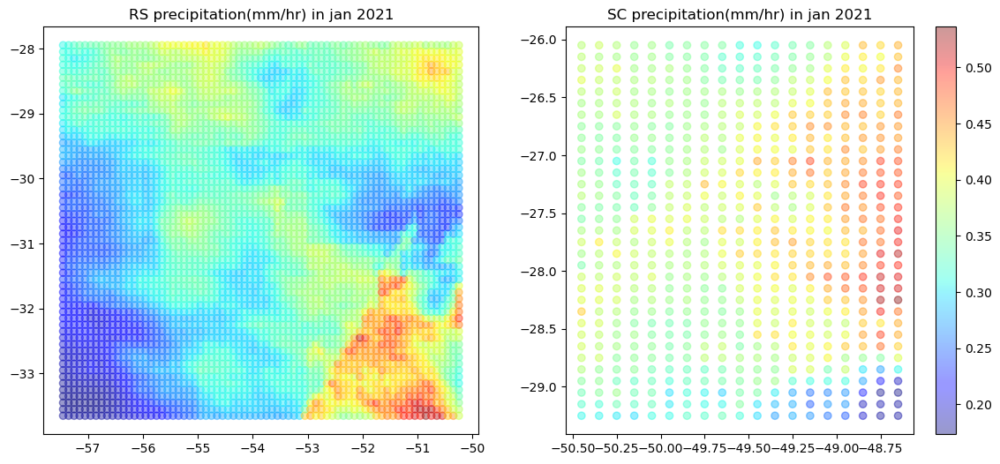

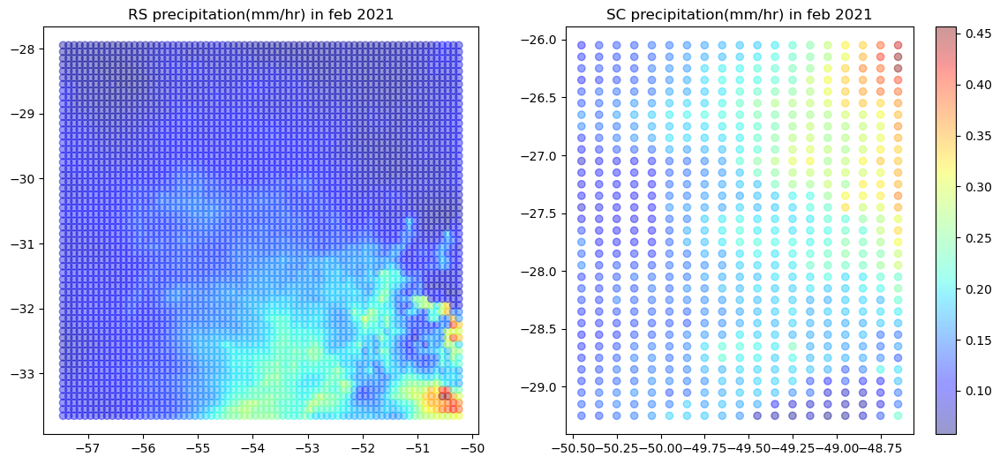

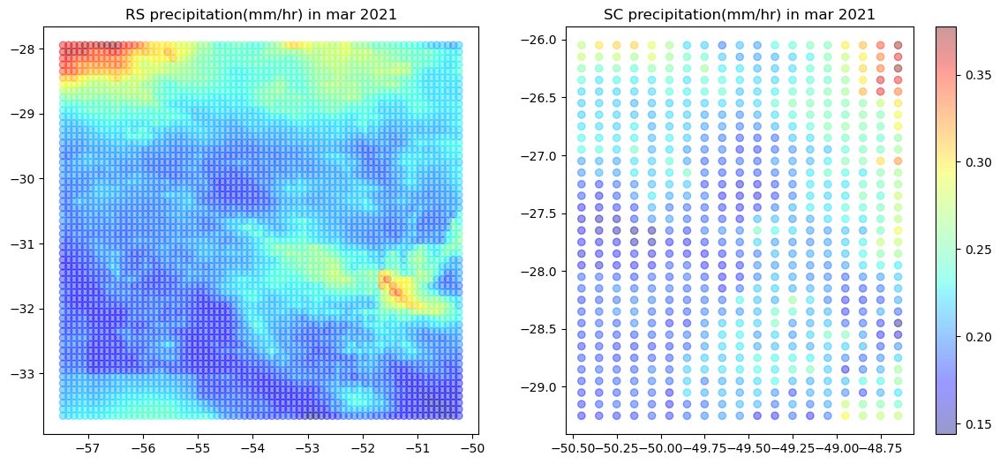

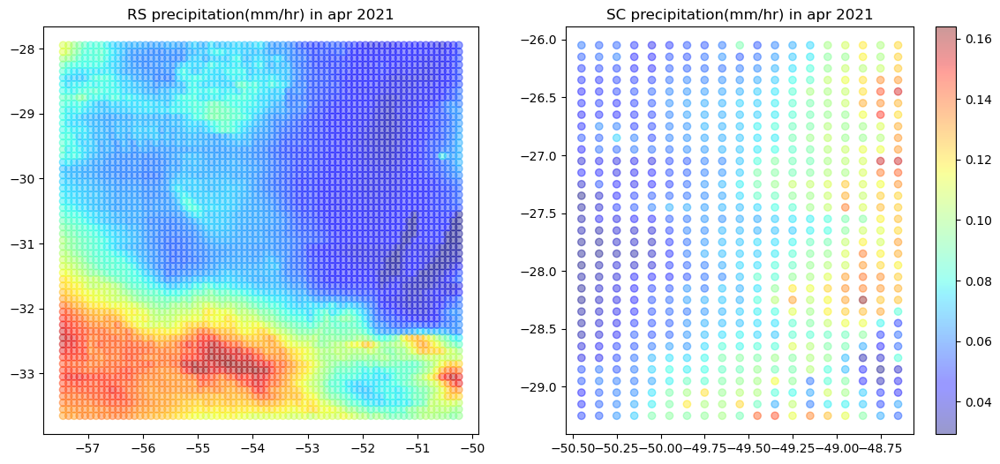

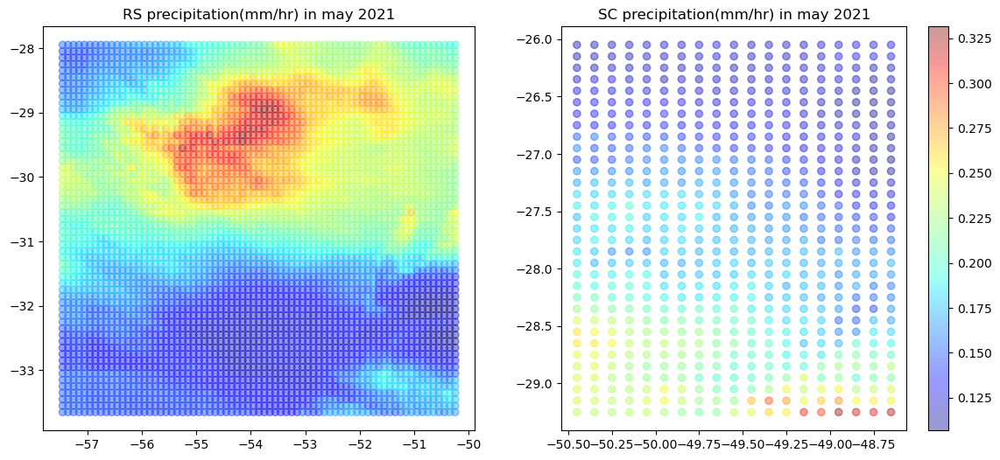

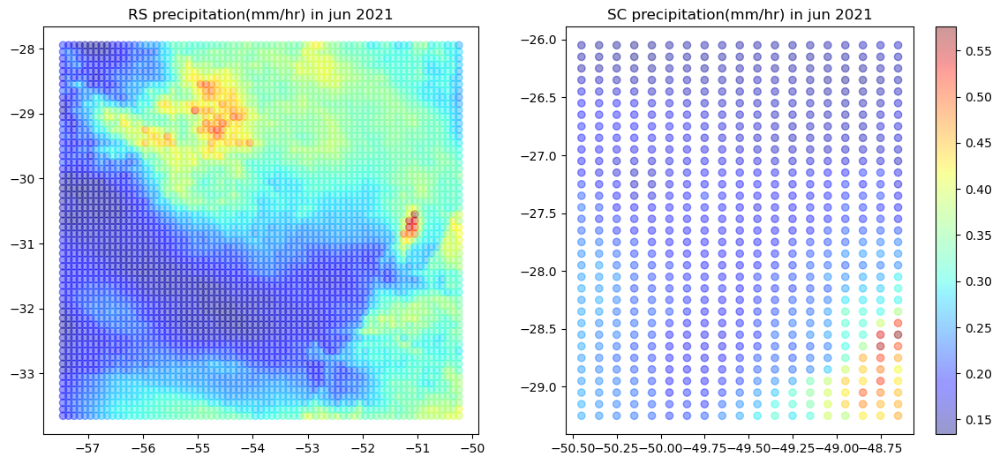

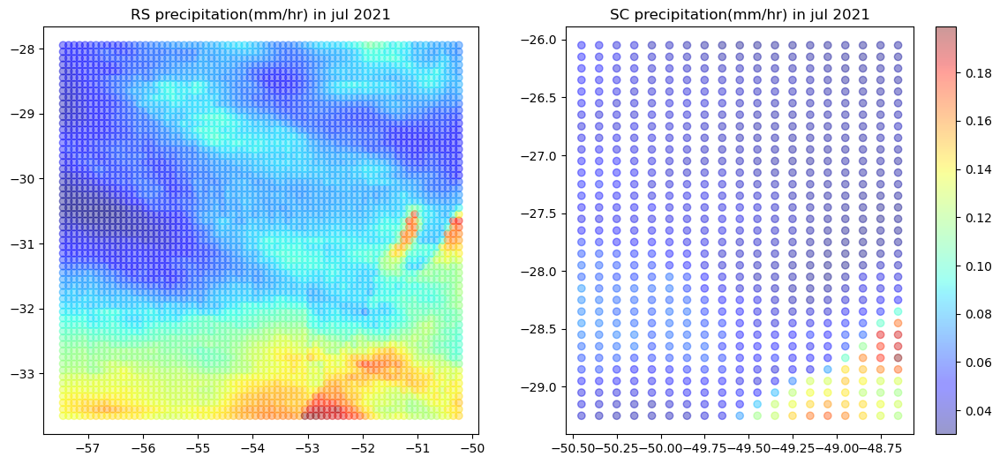

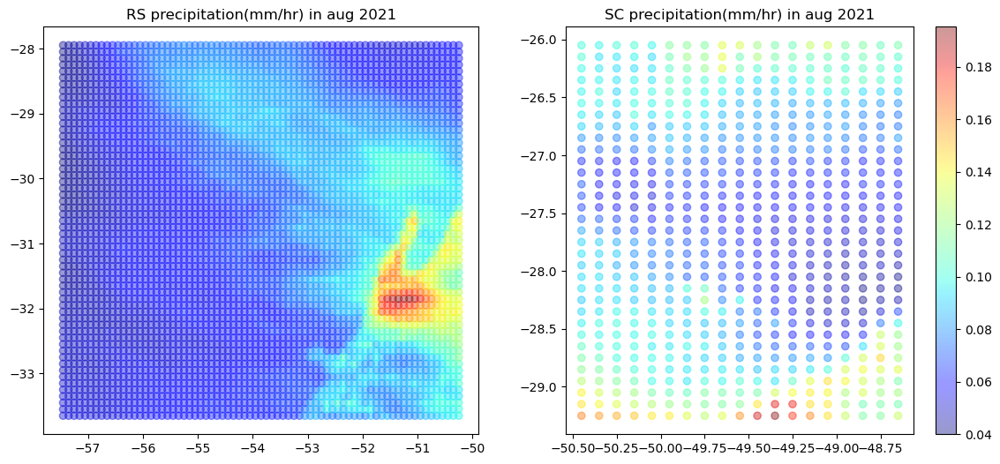

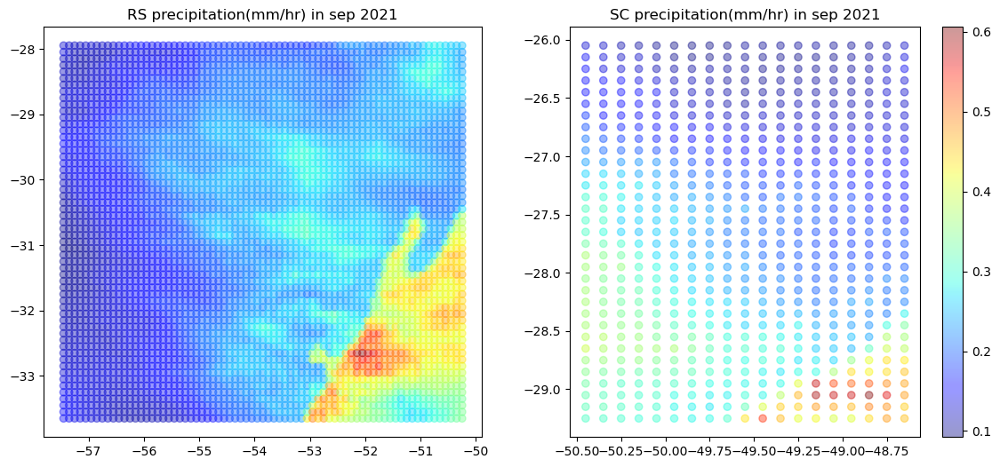

In [6]:
for m in months[:9]:
    filter_region('2021',m)


## Now process 2020 data

Now processing:  GPM data/2020/3B-MO.MS.MRG.3IMERG.20200101-S000000-E235959.01.V06B.HDF5
Saving RS data to:  GPM data/2020/RS_jan_2020.csv
Saving SC data to:  GPM data/2020/SC_jan_2020.csv


Now processing:  GPM data/2020/3B-MO.MS.MRG.3IMERG.20200201-S000000-E235959.02.V06B.HDF5
Saving RS data to:  GPM data/2020/RS_feb_2020.csv
Saving SC data to:  GPM data/2020/SC_feb_2020.csv


Now processing:  GPM data/2020/3B-MO.MS.MRG.3IMERG.20200301-S000000-E235959.03.V06B.HDF5
Saving RS data to:  GPM data/2020/RS_mar_2020.csv
Saving SC data to:  GPM data/2020/SC_mar_2020.csv


Now processing:  GPM data/2020/3B-MO.MS.MRG.3IMERG.20200401-S000000-E235959.04.V06B.HDF5
Saving RS data to:  GPM data/2020/RS_apr_2020.csv
Saving SC data to:  GPM data/2020/SC_apr_2020.csv


Now processing:  GPM data/2020/3B-MO.MS.MRG.3IMERG.20200501-S000000-E235959.05.V06B.HDF5
Saving RS data to:  GPM data/2020/RS_may_2020.csv
Saving SC data to:  GPM data/2020/SC_may_2020.csv


Now processing:  GPM data/2020/3B-MO.MS.MRG.3

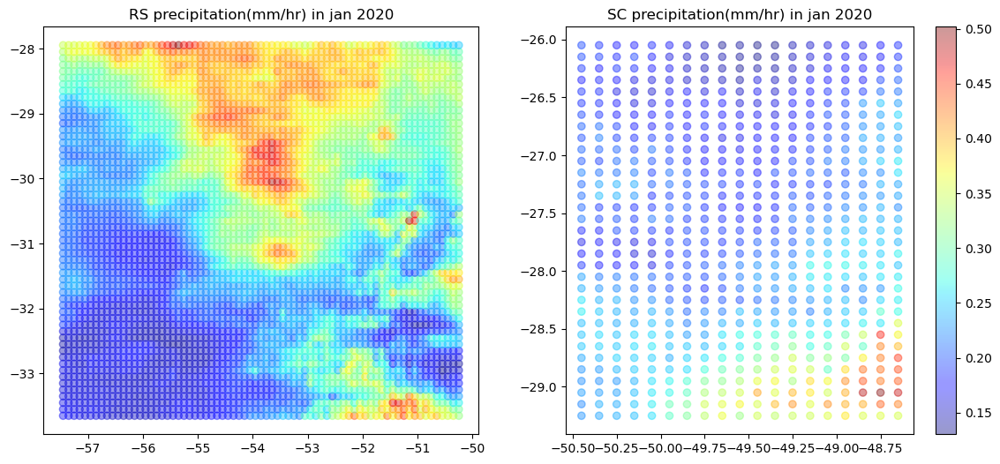

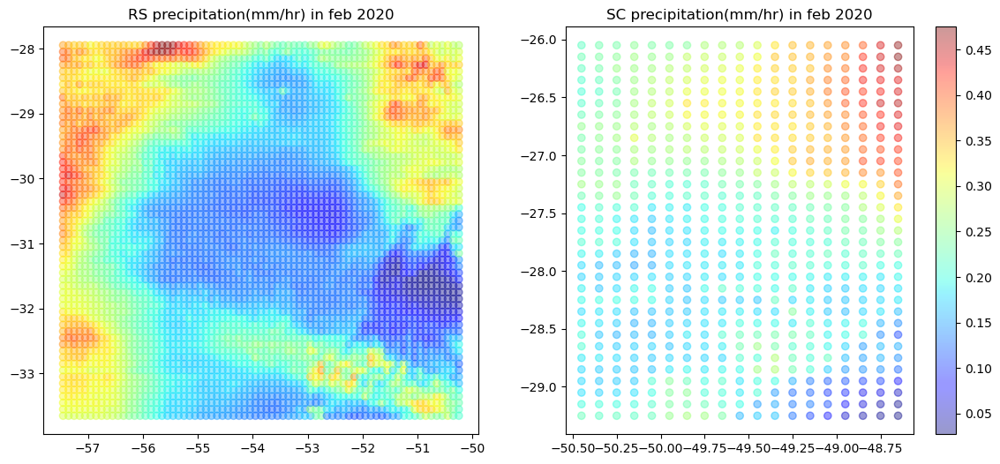

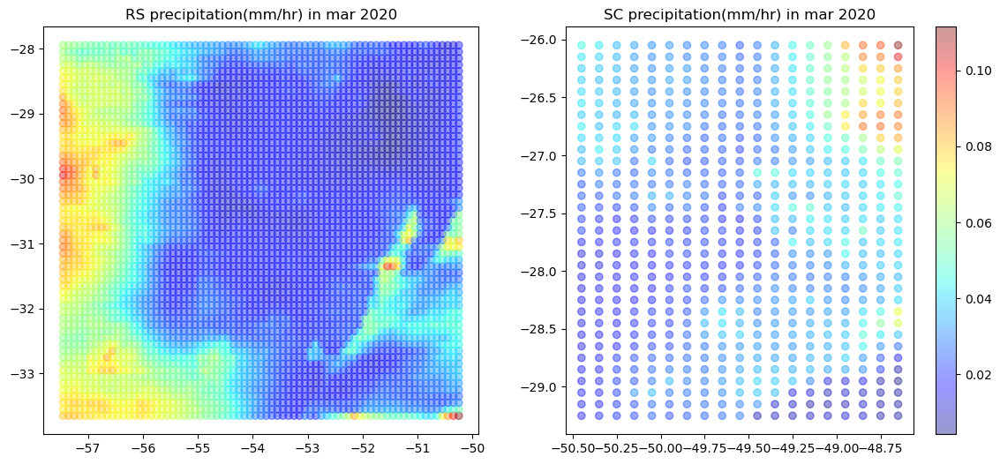

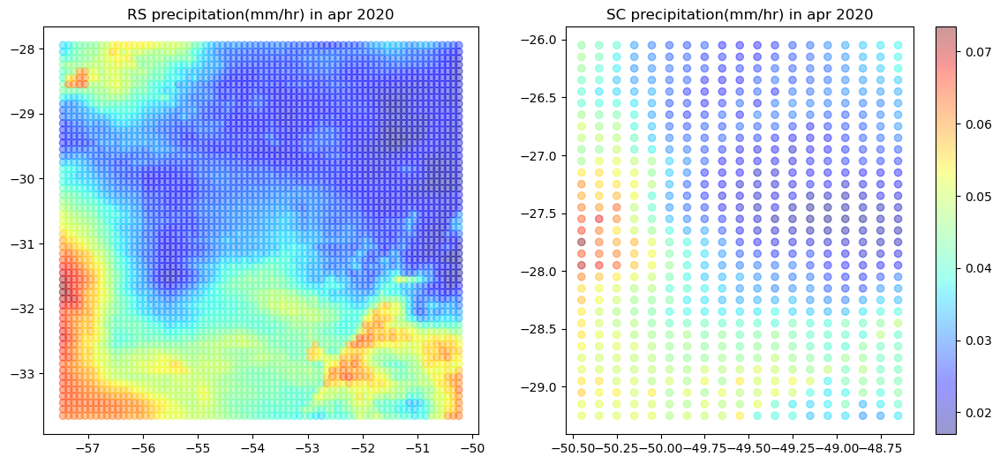

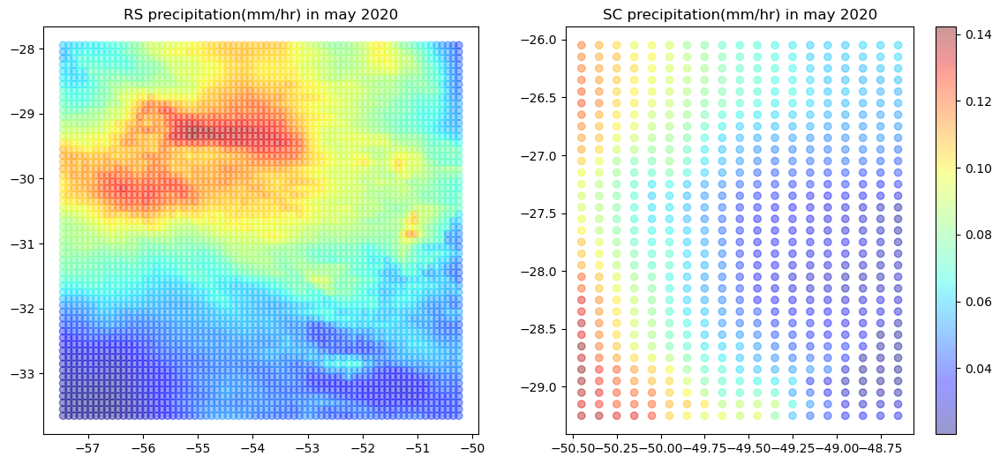

...

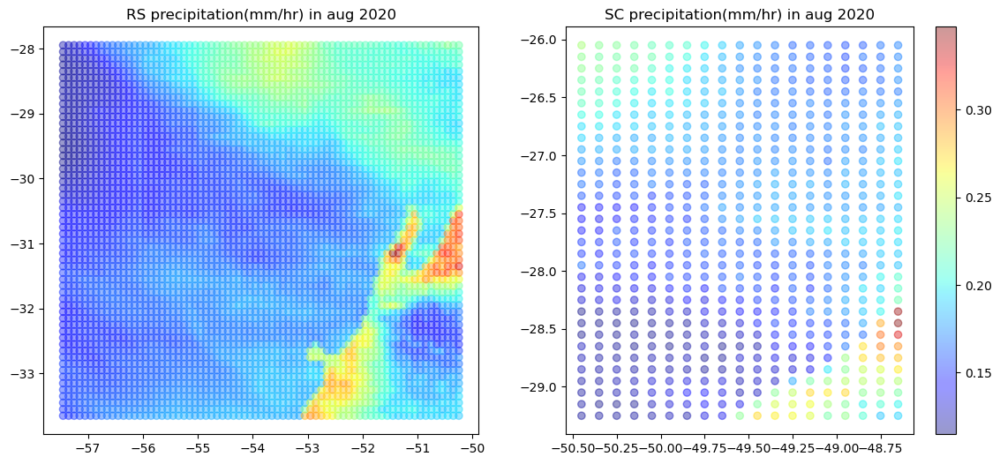

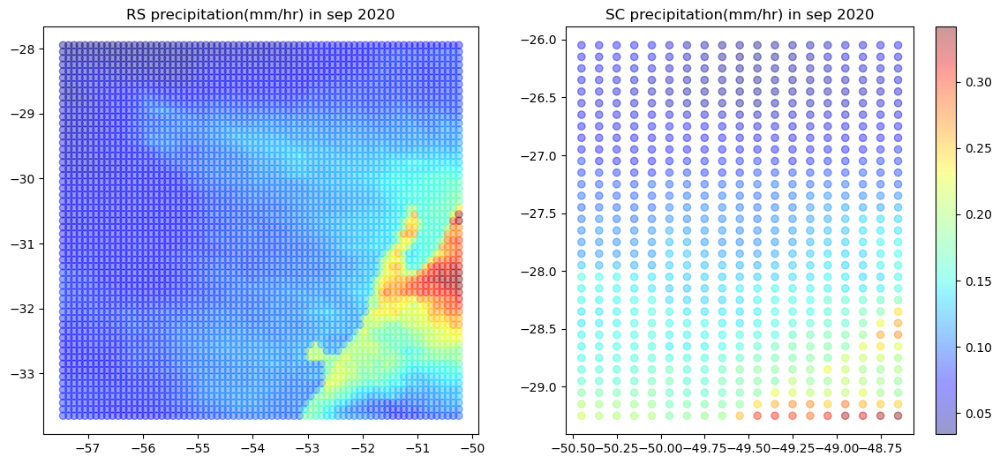

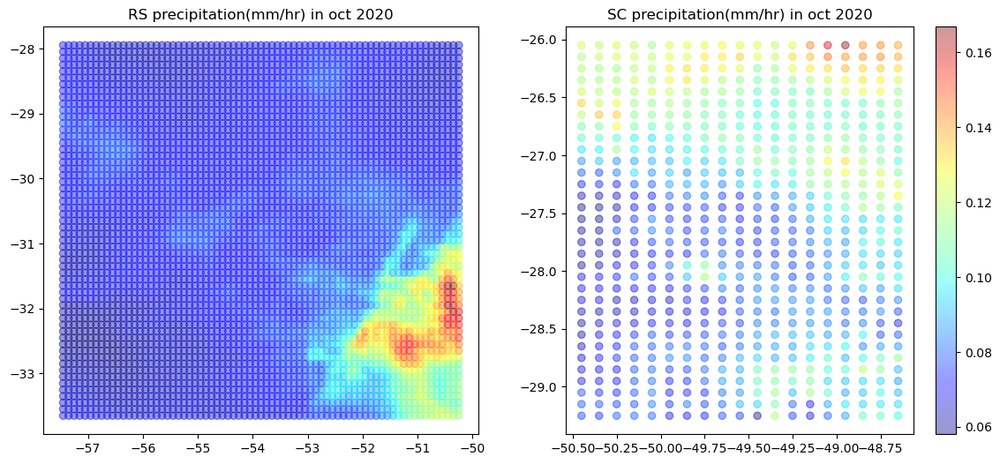

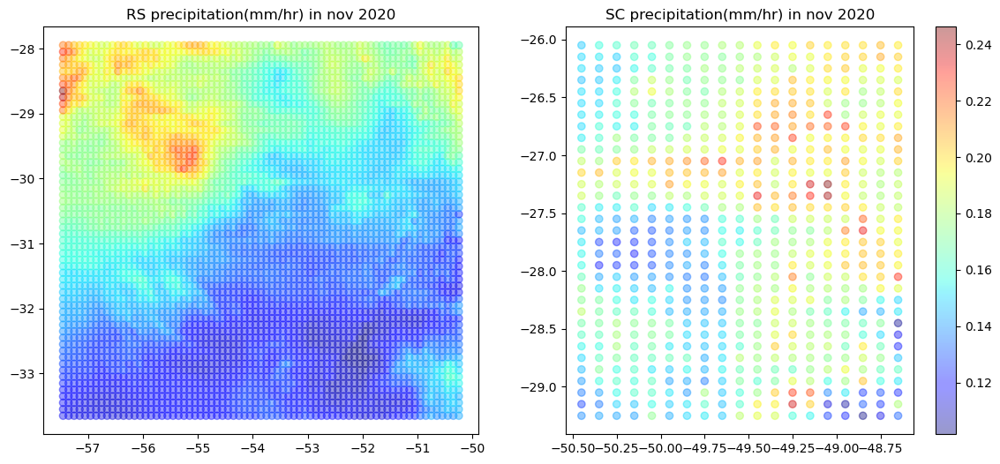

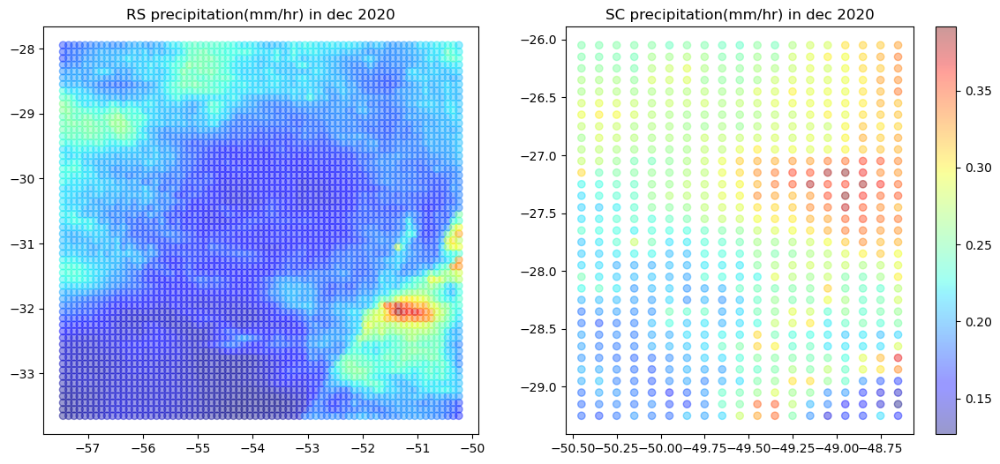

In [7]:
for m in months:
    filter_region('2020',m)